# MUSIC VISUALIZATION

Music is a kind of code that involves different combinations from the same series of notes, with different pitch and duration. In the 12-tone chromatic scale, each note has a name (for example, A4, B4, D5) showing their pitch or in other words, their position in the staff. A musical composition is made from specific arrangements of notes by the composer. Using these information, music can be visualized based on the relationship between the notes,  in order to give the user a clear idea of the structure and musical method of the composer

This function will look into the MusicXML file format, which is respectively suitable for Python programming, trying to extract data from it and re-interpret those data into NetworkX input. Beside that, I also present different variations of visualization, since each one has its own specific way to help the user understand the music piece's structure.

# Part 1: Data extraction

In [1]:
from xml.dom.minidom import parse, parseString
import random

# Import the MusicXML file
dom = parse("XML/SCHUBERT Staendchen.xml") 

In [2]:
# Get the music title
NAME = dom.getElementsByTagName("credit-words")
Title = ''
for i in range(len(NAME)):
    Title = Title +(str(NAME[i].firstChild.nodeValue)) + ' '

In [3]:
# Get information of notes from the xml file
NoteStep = []
NoteType = []
NoteAlter = []
NoteFrequency = []

# Get the note name and put into a list
NS = dom.getElementsByTagName("step")
for i in range(len(NS)):
    NoteStep.append(str(NS[i].firstChild.nodeValue))

# Get the note octave that shows it actual pitch
NO = dom.getElementsByTagName("octave")
for i in range(len(NS)):
    NoteStep[i] = NoteStep[i] + (str(NO[i].firstChild.nodeValue))

# Get the note type, or duration, then re-map the data from string to number
NT = dom.getElementsByTagName("type")
for i in range(len(NT)):     
    NoteType.append(str(NT[i].firstChild.nodeValue))
for i in range(len(NoteStep)):
    NoteStep[i]=NoteStep[i]+'_'+NoteType[i]

# Filter duplicate values
N = set(NoteStep)
NoteName = list(N)

# Get the appear frequency of each note
for i in range(len(NoteName)):
    NoteFrequency.append(10);
    for j in range(len(NoteStep)):
        if NoteStep[j] == NoteName[i]:
            NoteFrequency[i] = NoteFrequency[i]+1.5

# Mutiple the frequency value so they can be used for node size
for i in range(len(NoteFrequency)):
    NoteFrequency[i] = NoteFrequency[i]*100

# Color map based on note duration
NF = []
Color = set()
NoteColor = []
for i in range(len(NoteName)):
    NF.append(NoteName[i].split('_')[1])
NF1 = set(NF)
NF2 = list(NF1)
Color.add(random.choice('bgrcmy'))
while len(Color)<len(NF2):
    Color.add(random.choice('bgrcmy'))
C = list(Color)
for i in range(len(NF)):
    for j in range(len(NF2)):
        if NF[i] == NF2[j]:
            NoteColor.append(C[j])

In [4]:
edge1 = []
edgeall = []
EdgeColor = []
Edge = []
E = []

# Get the relationship or connection between every note and its adjacent notes
for i in range(1,len(NoteStep)-1):
    if (NoteStep[i-1] != NoteStep[i]):
        edge1=[NoteStep[i-1],NoteStep[i]]
        edgeall.append(edge1)

# Filter the list, delete duplicate values
for i in range(len(edgeall)):
    E.append(edgeall[i][0]+'/'+edgeall[i][1])
E1 = set(E)
Edge = list(E1)

# Get Edge width from the frequency of apearance of each direct relationship
EdgeWidth=[]
count=0
for i in range(len(Edge)):
    EdgeWidth.append(1)
    for j in range(len(E)):
        if Edge[i]==E[j]:
            EdgeWidth[count] = EdgeWidth[count]+0.2
    count = count+1

# Get Edge color from the color of the first note in each relationship
EdgeColor = []
for i in range(len(Edge)):
    Edge[i] = [Edge[i].split('/')[0],Edge[i].split('/')[1]]
    for j in range(len(NF2)):
        if Edge[i][0].split('_')[1] == NF2[j]:
            EdgeColor.append(C[j])

# Part 2: Spring network

In [5]:
import networkx as nx
G = nx.DiGraph()

# Import nodes and export node label
for i in range(len(NoteName)):
    G.add_nodes_from([NoteName[i]],label=NoteName[i].split('_')[0])
Nlabel = nx.get_node_attributes(G,'label')

# Import and export edge attributes
for i in range(len(Edge)):
    G.add_edges_from([Edge[i]],color=EdgeColor[i],width=EdgeWidth[i])
    
Ecolor=nx.get_edge_attributes(G,'color')
Ewidth=nx.get_edge_attributes(G,'width')

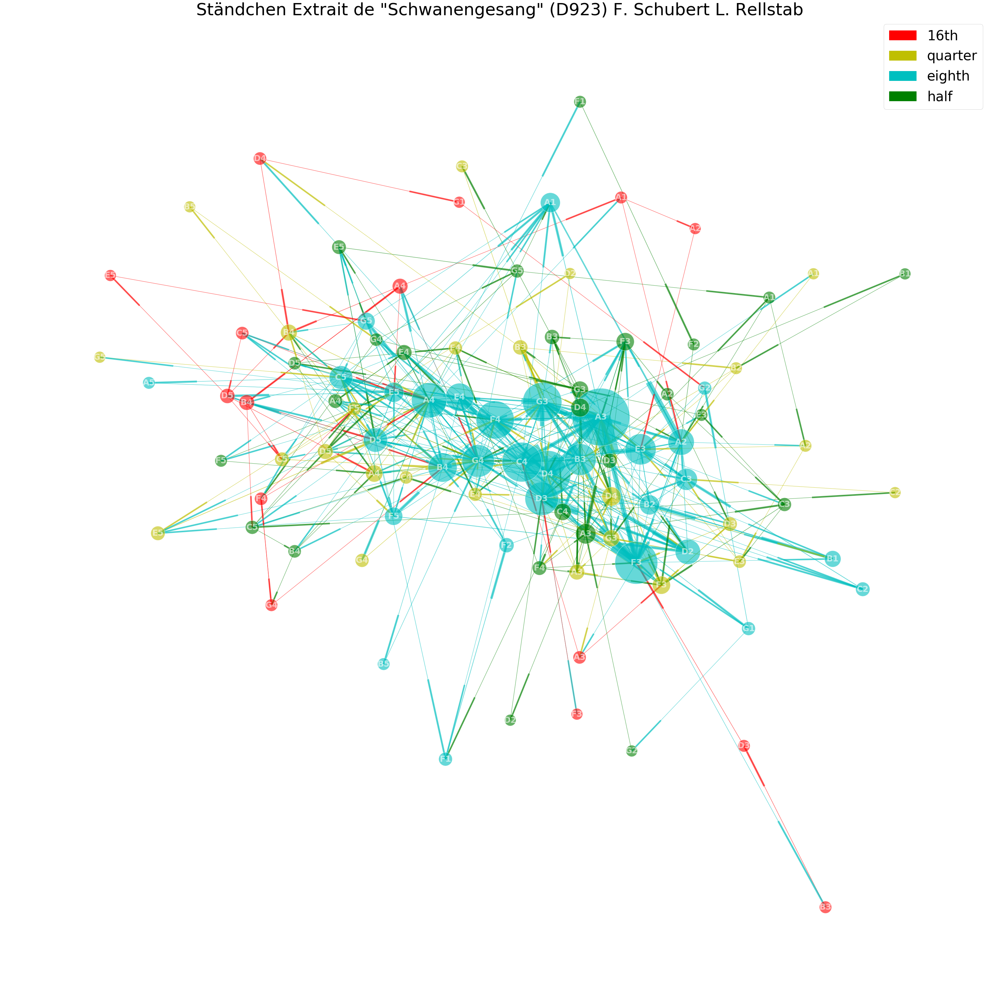

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Draw the network
plt.figure(figsize=(40,40))
nx.draw_spring(G, node_size=NoteFrequency, node_color=NoteColor, node_shape='o', 
        edge_color = Ecolor.values(), width = Ewidth.values(), alpha = 0.6, arrows=True, 
        with_labels=True, labels=Nlabel, font_size=25, font_color='white', font_weight='bold')

# Draw the outline of each node
ax = plt.gca() 
ax.collections[0].set_edgecolor("white") 

# Show the title
plt.title(Title,{'fontsize':50})

# Show the legend: color and note duration
legend=[]
for i in range(len(C)):
    legend.append(mpatches.Patch(color=C[i], label=NF2[i]))

plt.legend(handles=legend,prop={'size': 40})

plt.show()

The data integrated in the nodes and edges of this network are:

        . Each node shows a note and has the label which is the note's name (D3, C4, ...)
        . The color of the node show the duration, or type of the note (16th, eighth, quarter note, ...), so there can be different nodes with different color but have the same label
        . The size of the node show the appearing frequency of the musical note in the piece, the bigger the node, the more that note appears
        . The edge connect 2 nodes together with the direction. For example: a-->b means note b is at the right of note a in the music piece
        . The weight of the edge shows the appearing frequency of the relationship in the piece. For example, if the edge a-->b is bold, it means the composition note a to note b appears many time in the music piece.
        . The color of the edge shows their direction. For example, if an edge connect a-->b, it will have the color of a. So the direction information is always visible even without the arrow

The spring network automatically groups the note with the most connections together, so that we can see the main chords and composition that the composer used to create the music piece. In this case, it can be seen that he used eighth notes the most, typically A3, B3, D4, ...

# Part 3: Circular network and Arrow Patch

In [7]:
import networkx as nx
import numpy
G2 = nx.DiGraph()

# Add the node to the network
for i in range(len(NoteName)):
    G2.add_nodes_from([NoteName[i]],label=NoteName[i].split('_')[0])
Nlabel = nx.get_node_attributes(G,'label')

# Layout the node on the network circle
pos = nx.circular_layout(G2)

In [8]:
# Get the position of the node in networkx circle layout
posx = []
posy = []
for i in range(len(Edge)):
    if (Edge[j][0] in pos):
        posx.append(numpy.ndarray.tolist(pos.get(Edge[i][0])))
for i in range(len(Edge)):
    if (Edge[j][1] in pos):
        posy.append(numpy.ndarray.tolist(pos.get(Edge[i][1])))            

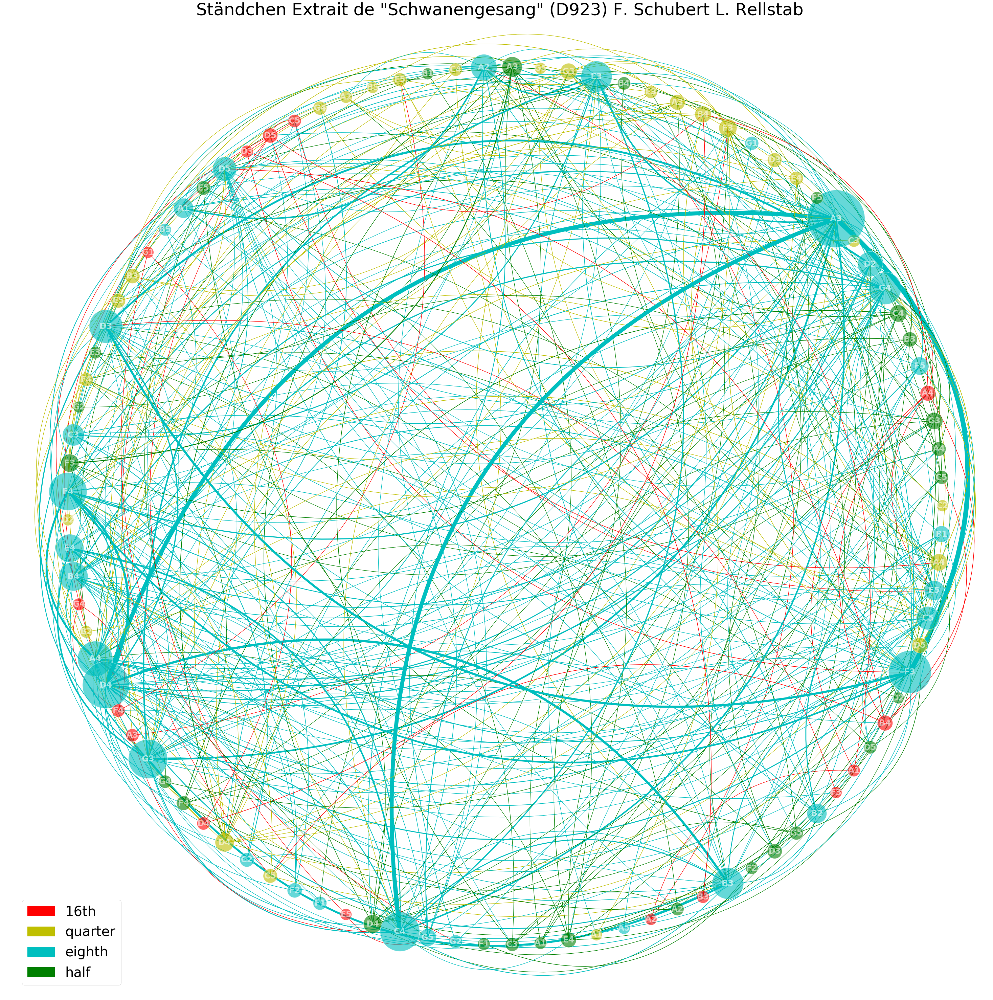

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Draw the nodes
plt.figure(figsize=(40,40))

nx.draw(G2, pos, node_size=NoteFrequency, node_color=NoteColor, node_shape='o', 
         alpha = 0.6, with_labels=True, labels=Nlabel, font_size=25, font_color='white', font_weight='bold')

ax = plt.gca() 

# Draw the arrow
for i in range(len(Edge)): 
     ax.add_patch(mpatches.FancyArrowPatch(posA = (posx[i][0], posx[i][1]), 
                          posB = (posy[i][0], posy[i][1]),
                          path=None, color = EdgeColor[i], linewidth = EdgeWidth[i],
                          arrowstyle='->',
                          connectionstyle='arc3, rad = 0.4'))

# Draw the outline of each node
ax.collections[0].set_edgecolor("white") 

# Show the title
plt.title(Title,{'fontsize':50})

# Show the legend: color and note duration
legend=[]
for i in range(len(C)):
    legend.append(mpatches.Patch(color=C[i], label=NF2[i]))

plt.legend(handles=legend,prop={'size': 40})

plt.show()

This is an attempt to combine NetworkX and Matplot Patch. The nodes is located on the circle thanks to NetworkX Circular layout function, then their position is extracted and translated into list structures that can be used to draw the Curve arrow (in this case, FancyArrowPatch). Other information is the same as the previous network.

# Part 4: Advanced-position network

In [10]:
import networkx as nx
import math
G3 = nx.DiGraph()

# Add nodes to the Network
Nodelabel = []

NodePosx = []
NodePosy = []
Pos3 = {}

# Define the list representing the node name and their position in the octave
N1 = ['C','D','E','F','G','A','B']
N2 = [1,2,3,4,5,6,7]
r = 1

# Make the position of the node from mathematical function
for i in range(len(NoteName)):
    r = int(NoteName[i][1])
    for j in range(7):
        if NoteName[i][0] == N1[j]:
            NodePosx.append(r*(math.cos(2*(math.pi/7)*N2[j]+100 - ord(NoteColor[i])))) 
            NodePosy.append(r*(math.sin(2*(math.pi/7)*N2[j]+100 - ord(NoteColor[i]))))
            # This is to make sure notes with the same name and different color (duration) dont overlap

# Create the position dictionary
for i in range(len(NoteName)):
    dict = {NoteName[i]:[NodePosx[i],NodePosy[i]]}
    Pos3.update(dict)

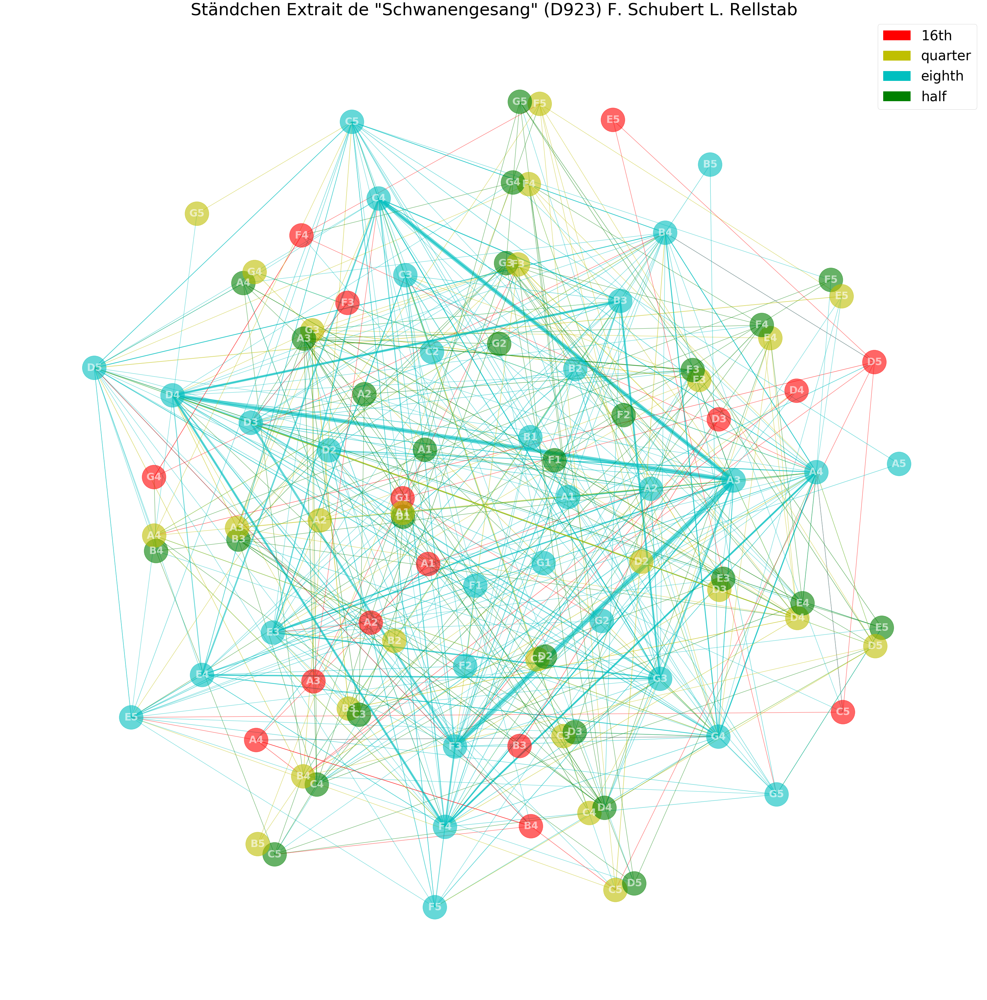

In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

plt.figure(figsize=(40,40))

for i in range(len(NoteName)):
    G3.add_nodes_from([NoteName[i]],label=NoteName[i].split('_')[0])
    
# Import and export edge attributes
for i in range(len(Edge)):
    G3.add_edges_from([Edge[i]],color=EdgeColor[i],width=EdgeWidth[i])
Ecolor=nx.get_edge_attributes(G3,'color')
Ewidth=nx.get_edge_attributes(G3,'width')
    
# Draw the network
nx.draw(G3, Pos3, node_size=5000, node_color=NoteColor, node_shape='o', 
        edge_color = Ecolor.values(), width = Ewidth.values(), alpha = 0.6, arrows=False, 
        with_labels=True, labels=Nlabel, font_size=30, font_color='white', font_weight='bold')

# Show the title
plt.title(Title,{'fontsize':50})

# Show the legend: color and note duration
legend=[]
for i in range(len(C)):
    legend.append(mpatches.Patch(color=C[i], label=NF2[i]))

plt.legend(handles=legend,prop={'size': 40})

plt.show()

The idea of this network is to visualize the nodes based on their notes' position on the octaves. The note's octave number (1,2,3 in C1, B2, A3,...) is used to caculate the circle's radius, while their position on the circle is decided by the note's name (A,BC,D,E,...).
This way, the data of the music piece is clearer for the user to see. Other information is the same as previous charts, except that the node's size is reduced to be the same in order to cause less confusion.

# Part 5: other examples

The function is tested with various Music XML files, below are some examples.

# Étude Op. 10, No. 5 in Gb major, Frédéric Chopin

<img src="https://serving.photos.photobox.com/61691923fbda7729478adafae8b0adac34c3b1de8ea524c984bd4762fa327148ba4ff125.jpg">

# String Quartet No 1 in F major Opus 18 N1 O14, Ludwig van Beethoven 

<img src="https://serving.photos.photobox.com/45901557e36d65bf044f6aedfd9d008e8eaf64dd16c008a9fcb7c6206d26434301eab096.jpg">